# Open Exploration

As we are interested in how dike ring 4 could best balance its economic objectives with a sustainable flood-risk management plan, we would want to first use open exploration to understand how regions in the uncertainty space map to the whole outcome map. Our focus will lay on the outcomes that are important to dike ring 4.

Using open exploration, we will systematically sample the uncertainty or decision space.

## Preparing the model for model runs

Importing all necessary libraries, checking that libraries are up-to-date, and choosing problem formulation.

In [1]:
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import time

In [2]:
# make sure pandas is version 1.0 or higher
# make sure networkx is verion 2.4 or higher
print(pd.__version__)
print(nx.__version__)

1.0.3
2.4


In [3]:
from ema_workbench import (Model, CategoricalParameter,
                           ScalarOutcome, IntegerParameter, RealParameter)
from dike_model_function import DikeNetwork  # @UnresolvedImport

def sum_over(*args):
    return sum(args)

We import the the problem formulation from the py file problem formulation. We chose problem formulation 5 for our open exploration, as it can give us the most insight about the influence of uncertainties and levers on the considered outcomes of our model. 

Furthermore, we define the policy that will be considered for our base case - no policy. That means no levers will be implemented.

In [1]:
# import all necessary tools from ema workbench
from ema_workbench import (Model, MultiprocessingEvaluator, Policy, Scenario, SequentialEvaluator, perform_experiments, ema_logging)

from ema_workbench.em_framework.evaluators import perform_experiments
from ema_workbench.em_framework.samplers import sample_uncertainties
from ema_workbench.util import ema_logging
import time
from problem_formulation import get_model_for_problem_formulation
from ema_workbench.util import utilities 


ema_logging.log_to_stderr(ema_logging.INFO)

#choose problem formulation number, between 0-5
dike_model, planning_steps = get_model_for_problem_formulation(5)
nopolicy = [Policy("base case", **{k.name: 0 for k in dike_model.levers})]

### Overview of all outcomes, uncertainties, and levers considered in problem formulation 5
As problem formulation 5 provides very detailed list of outcomes, the outcomes of interest will be filtered.

In [5]:
#enlisting outcomes
for outcome in dike_model.outcomes:
    print(repr(outcome))

ScalarOutcome('A.1_Expected Annual Damage 0')
ScalarOutcome('A.1_Dike Investment Costs 0')
ScalarOutcome('A.1_Expected Number of Deaths 0')
ScalarOutcome('A.2_Expected Annual Damage 0')
ScalarOutcome('A.2_Dike Investment Costs 0')
ScalarOutcome('A.2_Expected Number of Deaths 0')
ScalarOutcome('A.3_Expected Annual Damage 0')
ScalarOutcome('A.3_Dike Investment Costs 0')
ScalarOutcome('A.3_Expected Number of Deaths 0')
ScalarOutcome('A.4_Expected Annual Damage 0')
ScalarOutcome('A.4_Dike Investment Costs 0')
ScalarOutcome('A.4_Expected Number of Deaths 0')
ScalarOutcome('A.5_Expected Annual Damage 0')
ScalarOutcome('A.5_Dike Investment Costs 0')
ScalarOutcome('A.5_Expected Number of Deaths 0')
ScalarOutcome('RfR Total Costs 0')
ScalarOutcome('Expected Evacuation Costs 0')
ScalarOutcome('A.1_Expected Annual Damage 1')
ScalarOutcome('A.1_Dike Investment Costs 1')
ScalarOutcome('A.1_Expected Number of Deaths 1')
ScalarOutcome('A.2_Expected Annual Damage 1')
ScalarOutcome('A.2_Dike Investment

In [6]:
#enlisting uncertainties, their types (RealParameter/IntegerParameter/CategoricalParameter), lower boundary, and upper boundary
for unc in dike_model.uncertainties:
    print(repr(unc))
    
uncertainties = dike_model.uncertainties

import copy
uncertainties = copy.deepcopy(dike_model.uncertainties)

CategoricalParameter('discount rate 0', [0, 1, 2, 3])
CategoricalParameter('discount rate 1', [0, 1, 2, 3])
CategoricalParameter('discount rate 2', [0, 1, 2, 3])
CategoricalParameter('discount rate 3', [0, 1, 2, 3])
IntegerParameter('A.0_ID flood wave shape', 0, 132)
RealParameter('A.1_Bmax', 30, 350)
RealParameter('A.1_pfail', 0, 1)
CategoricalParameter('A.1_Brate', [0, 1, 2])
RealParameter('A.2_Bmax', 30, 350)
RealParameter('A.2_pfail', 0, 1)
CategoricalParameter('A.2_Brate', [0, 1, 2])
RealParameter('A.3_Bmax', 30, 350)
RealParameter('A.3_pfail', 0, 1)
CategoricalParameter('A.3_Brate', [0, 1, 2])
RealParameter('A.4_Bmax', 30, 350)
RealParameter('A.4_pfail', 0, 1)
CategoricalParameter('A.4_Brate', [0, 1, 2])
RealParameter('A.5_Bmax', 30, 350)
RealParameter('A.5_pfail', 0, 1)
CategoricalParameter('A.5_Brate', [0, 1, 2])


In [7]:
#enlisting policy levers, their types (RealParameter/IntegerParameter), lower boundary, and upper boundary
for policy in dike_model.levers:
    print(repr(policy))
    
levers = dike_model.levers 

import copy
levers = copy.deepcopy(dike_model.levers)

IntegerParameter('0_RfR 0', 0, 1)
IntegerParameter('0_RfR 1', 0, 1)
IntegerParameter('0_RfR 2', 0, 1)
IntegerParameter('0_RfR 3', 0, 1)
IntegerParameter('1_RfR 0', 0, 1)
IntegerParameter('1_RfR 1', 0, 1)
IntegerParameter('1_RfR 2', 0, 1)
IntegerParameter('1_RfR 3', 0, 1)
IntegerParameter('2_RfR 0', 0, 1)
IntegerParameter('2_RfR 1', 0, 1)
IntegerParameter('2_RfR 2', 0, 1)
IntegerParameter('2_RfR 3', 0, 1)
IntegerParameter('3_RfR 0', 0, 1)
IntegerParameter('3_RfR 1', 0, 1)
IntegerParameter('3_RfR 2', 0, 1)
IntegerParameter('3_RfR 3', 0, 1)
IntegerParameter('4_RfR 0', 0, 1)
IntegerParameter('4_RfR 1', 0, 1)
IntegerParameter('4_RfR 2', 0, 1)
IntegerParameter('4_RfR 3', 0, 1)
IntegerParameter('EWS_DaysToThreat', 0, 4)
IntegerParameter('A.1_DikeIncrease 0', 0, 10)
IntegerParameter('A.1_DikeIncrease 1', 0, 10)
IntegerParameter('A.1_DikeIncrease 2', 0, 10)
IntegerParameter('A.1_DikeIncrease 3', 0, 10)
IntegerParameter('A.2_DikeIncrease 0', 0, 10)
IntegerParameter('A.2_DikeIncrease 1', 0, 10)
I

## Running the model with a Base Case

To start our open exploration, we will run the model with no policy. We chose to run the model for 1000 scenarios and a multiprocessing evaluator to fasten the evaluating process.

In [9]:
#running the model through EMA workbench
ema_logging.log_to_stderr(ema_logging.INFO)

start = time.time()
with MultiprocessingEvaluator(dike_model) as evaluator:
    experiments,outcomes = evaluator.perform_experiments(scenarios=1000, policies=nopolicy)


end = time.time()
print("time taken: {} seconds".format((end-start)))


[MainProcess/INFO] pool started
[MainProcess/INFO] performing 1000 scenarios * 1 policies * 1 model(s) = 1000 experiments
[MainProcess/INFO] 100 cases completed
[MainProcess/INFO] 200 cases completed
[MainProcess/INFO] 300 cases completed
[MainProcess/INFO] 400 cases completed
[MainProcess/INFO] 500 cases completed
[MainProcess/INFO] 600 cases completed
[MainProcess/INFO] 700 cases completed
[MainProcess/INFO] 800 cases completed
[MainProcess/INFO] 900 cases completed
[MainProcess/INFO] 1000 cases completed
[MainProcess/INFO] experiments finished
[MainProcess/INFO] terminating pool


time taken: 939.7430655956268 seconds


To be able to reuse the experiments and outcomes of the model, we will save as them as results.

In [15]:
results = experiments,outcomes
utilities.save_results(results, 'BaseCase_1000_PF5')

[MainProcess/INFO] results saved successfully to /Users/rtseinstein/Documents/GitHub/common_MBDM/final assignment/BaseCase_1000_PF5


In [11]:
results = utilities.load_results('BaseCase_1000_PF5')
results

[MainProcess/INFO] results loaded succesfully from C:\Users\VANNESYA\Documents\Study\Q4\EPA1361\common_MBDM\final assignment\BaseCase_1000_PF5


(     A.0_ID flood wave shape    A.1_Bmax A.1_Brate  A.1_pfail    A.2_Bmax  \
 0                       85.0  346.078772       1.0   0.675984  266.477718   
 1                        8.0   30.028143       1.5   0.859666  166.507073   
 2                       99.0   88.834003       1.5   0.679894  102.430192   
 3                      124.0  253.011207      10.0   0.856555  216.003097   
 4                       49.0  254.962619      10.0   0.402276  323.220951   
 ..                       ...         ...       ...        ...         ...   
 995                     52.0  302.893074       1.0   0.488335  146.381193   
 996                    128.0   60.810812       1.0   0.403924  331.931663   
 997                    112.0  214.953612       1.5   0.950826   36.769269   
 998                     72.0   47.826848      10.0   0.898242  262.964277   
 999                     66.0   46.025051       1.5   0.576035  346.330334   
 
     A.2_Brate  A.2_pfail    A.3_Bmax A.3_Brate  A.3_pfail  ..

In [18]:
outcomes = pd.DataFrame(outcomes)
outcomes

,A.1_Expected Annual Damage 0,A.1_Dike Investment Costs 0,A.1_Expected Number of Deaths 0,A.2_Expected Annual Damage 0,A.2_Dike Investment Costs 0,A.2_Expected Number of Deaths 0,A.3_Expected Annual Damage 0,A.3_Dike Investment Costs 0,A.3_Expected Number of Deaths 0,A.4_Expected Annual Damage 0,...,A.3_Dike Investment Costs 3,A.3_Expected Number of Deaths 3,A.4_Expected Annual Damage 3,A.4_Dike Investment Costs 3,A.4_Expected Number of Deaths 3,A.5_Expected Annual Damage 3,A.5_Dike Investment Costs 3,A.5_Expected Number of Deaths 3,RfR Total Costs 3,Expected Evacuation Costs 3
0,6.833754e+06,0,0.009442,3.519336e+06,0,0.006609,3.572068e+08,0,1.146792,0.000000e+00,...,0,1.146792,0.000000e+00,0,0.000000,0.000000e+00,0,0.000000,0.0,0.0
1,0.000000e+00,0,0.000000,1.949421e+08,0,0.281870,5.517566e+07,0,0.157227,0.000000e+00,...,0,0.157227,0.000000e+00,0,0.000000,0.000000e+00,0,0.000000,0.0,0.0
2,1.629577e+07,0,0.017554,1.569261e+07,0,0.022348,3.876383e+06,0,0.010514,1.651674e+07,...,0,0.010514,1.895164e+07,0,0.011292,0.000000e+00,0,0.000000,0.0,0.0
3,0.000000e+00,0,0.000000,6.378880e+06,0,0.011883,1.675471e+07,0,0.058224,1.824028e+07,...,0,0.058224,2.059539e+07,0,0.015772,0.000000e+00,0,0.000000,0.0,0.0
4,1.761271e+08,0,0.202266,0.000000e+00,0,0.000000,0.000000e+00,0,0.000000,0.000000e+00,...,0,0.000000,0.000000e+00,0,0.000000,1.408909e+07,0,0.023467,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,5.668782e+07,0,0.051635,2.063669e+08,0,0.228675,1.990092e+08,0,0.432029,0.000000e+00,...,0,0.432029,0.000000e+00,0,0.000000,0.000000e+00,0,0.000000,0.0,0.0
996,2.041735e+08,0,0.206898,1.576028e+06,0,0.002257,0.000000e+00,0,0.000000,1.180295e+06,...,0,0.000000,1.354294e+06,0,0.000915,0.000000e+00,0,0.000000,0.0,0.0
997,0.000000e+00,0,0.000000,1.967151e+08,0,0.285719,2.581311e+07,0,0.077666,0.000000e+00,...,0,0.077666,0.000000e+00,0,0.000000,9.465795e+05,0,0.001615,0.0,0.0
998,0.000000e+00,0,0.000000,4.569459e+06,0,0.006741,3.891234e+07,0,0.104186,3.758552e+07,...,0,0.104186,4.312638e+07,0,0.022791,0.000000e+00,0,0.000000,0.0,0.0


### Prepare the results for open exploration

In [28]:
# load results from csv file if needed 
results = utilities.load_results('BaseCase_1000_PF5')
experiments, outcomes = results
outcomes = pd.DataFrame(outcomes)
experiments = pd.DataFrame(experiments)
results = experiments.join(outcomes)
results = results.drop(columns="model")
results.head()


[MainProcess/INFO] results loaded succesfully from /Users/rtseinstein/Documents/GitHub/common_MBDM/final assignment/BaseCase_1000_PF5


,A.0_ID flood wave shape,A.1_Bmax,A.1_Brate,A.1_pfail,A.2_Bmax,A.2_Brate,A.2_pfail,A.3_Bmax,A.3_Brate,A.3_pfail,...,A.3_Dike Investment Costs 3,A.3_Expected Number of Deaths 3,A.4_Expected Annual Damage 3,A.4_Dike Investment Costs 3,A.4_Expected Number of Deaths 3,A.5_Expected Annual Damage 3,A.5_Dike Investment Costs 3,A.5_Expected Number of Deaths 3,RfR Total Costs 3,Expected Evacuation Costs 3
0,85.0,346.078772,1.0,0.675984,266.477718,10.0,0.800023,338.223938,1.5,0.069049,...,0,1.146792,0.000000e+00,0,0.000000,0.000000e+00,0,0.000000,0.0,0.0
1,8.0,30.028143,1.5,0.859666,166.507073,1.0,0.068389,236.214399,10.0,0.216362,...,0,0.157227,0.000000e+00,0,0.000000,0.000000e+00,0,0.000000,0.0,0.0
2,99.0,88.834003,1.5,0.679894,102.430192,10.0,0.502623,194.539239,1.5,0.693799,...,0,0.010514,1.895164e+07,0,0.011292,0.000000e+00,0,0.000000,0.0,0.0
3,124.0,253.011207,10.0,0.856555,216.003097,10.0,0.704073,275.449093,1.5,0.604649,...,0,0.058224,2.059539e+07,0,0.015772,0.000000e+00,0,0.000000,0.0,0.0
4,49.0,254.962619,10.0,0.402276,323.220951,1.0,0.913708,62.174443,1.5,0.712240,...,0,0.000000,0.000000e+00,0,0.000000,1.408909e+07,0,0.023467,0.0,0.0


In [30]:
results1= results
results1= pd.DataFrame(results1)

def aggregate_outcomes(results, outcome):
    ''' This function aggregates the outcomes across locations and across each timestep. 
    The input are the results of a model run, the outcomes is a selected outcome. 
    A dataframe including disaggregated and aggregated results will be returned.'''
    list_outcomes_columns = []

    for i in results.columns:
        if outcome in i:
            list_outcomes_columns.append(i)

    results["Total " + str(outcome)
            ] = results[list_outcomes_columns].sum(axis=1)

aggregate_outcomes(results1, "Expected Annual Damage")
aggregate_outcomes(results1, "Expected Number of Deaths")



In [32]:
results1

,A.0_ID flood wave shape,A.1_Bmax,A.1_Brate,A.1_pfail,A.2_Bmax,A.2_Brate,A.2_pfail,A.3_Bmax,A.3_Brate,A.3_pfail,...,A.4_Expected Annual Damage 3,A.4_Dike Investment Costs 3,A.4_Expected Number of Deaths 3,A.5_Expected Annual Damage 3,A.5_Dike Investment Costs 3,A.5_Expected Number of Deaths 3,RfR Total Costs 3,Expected Evacuation Costs 3,Total Expected Annual Damage,Total Expected Number of Deaths
0,85.0,346.078772,1.0,0.675984,266.477718,10.0,0.800023,338.223938,1.5,0.069049,...,0.000000e+00,0,0.000000,0.000000e+00,0,0.000000,0.0,0.0,1.669889e+09,4.651375
1,8.0,30.028143,1.5,0.859666,166.507073,1.0,0.068389,236.214399,10.0,0.216362,...,0.000000e+00,0,0.000000,0.000000e+00,0,0.000000,0.0,0.0,9.432685e+08,1.756390
2,99.0,88.834003,1.5,0.679894,102.430192,10.0,0.502623,194.539239,1.5,0.693799,...,1.895164e+07,0,0.011292,0.000000e+00,0,0.000000,0.0,0.0,2.108957e+08,0.246827
3,124.0,253.011207,10.0,0.856555,216.003097,10.0,0.704073,275.449093,1.5,0.604649,...,2.059539e+07,0,0.015772,0.000000e+00,0,0.000000,0.0,0.0,2.022532e+08,0.343517
4,49.0,254.962619,10.0,0.402276,323.220951,1.0,0.913708,62.174443,1.5,0.712240,...,0.000000e+00,0,0.000000,1.408909e+07,0,0.023467,0.0,0.0,7.829413e+08,0.902929
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,52.0,302.893074,1.0,0.488335,146.381193,1.0,0.084495,150.673037,1.0,0.199129,...,0.000000e+00,0,0.000000,0.000000e+00,0,0.000000,0.0,0.0,1.740054e+09,2.849354
996,128.0,60.810812,1.0,0.403924,331.931663,1.5,0.726483,157.552587,1.0,0.995101,...,1.354294e+06,0,0.000915,0.000000e+00,0,0.000000,0.0,0.0,8.636360e+08,0.840283
997,112.0,214.953612,1.5,0.950826,36.769269,10.0,0.049510,146.288758,1.0,0.424678,...,0.000000e+00,0,0.000000,9.465795e+05,0,0.001615,0.0,0.0,8.432506e+08,1.459998
998,72.0,47.826848,10.0,0.898242,262.964277,10.0,0.832477,312.842116,1.0,0.500048,...,4.312638e+07,0,0.022791,0.000000e+00,0,0.000000,0.0,0.0,3.182431e+08,0.534870


To filter the results for dike ring 4 a new dataframe is created that only includes the outcomes regarding dike ring 4 and the aggregated outcomes. We will focus our open exploration on the expected annual damage and the expected number of deaths from now on.

In [78]:
req_vars=[]
a4 = "A.4"
ead="Expected Annual Damage"
ed = "Expected Number of Deaths"
for cols in results1.columns:
    if a4 in cols:
        if ead in cols: 
            req_vars.append(cols)
        if ed in cols:
            req_vars.append(cols)

results_a4=results1[req_vars]

In [79]:
aggregate_outcomes(results_a4, "Expected Annual Damage")
aggregate_outcomes(results_a4, "Expected Number of Deaths")


In [80]:
results_a4

,A.4_Expected Annual Damage 0,A.4_Expected Number of Deaths 0,A.4_Expected Annual Damage 1,A.4_Expected Number of Deaths 1,A.4_Expected Annual Damage 2,A.4_Expected Number of Deaths 2,A.4_Expected Annual Damage 3,A.4_Expected Number of Deaths 3,Total Expected Annual Damage,Total Expected Number of Deaths
0,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000
1,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000
2,1.651674e+07,0.011292,1.451373e+07,0.011292,1.651674e+07,0.011292,1.895164e+07,0.011292,6.649885e+07,0.045166
3,1.824028e+07,0.015772,2.689291e+07,0.015772,2.343772e+07,0.015772,2.059539e+07,0.015772,8.916630e+07,0.063089
4,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000
...,...,...,...,...,...,...,...,...,...,...
995,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000
996,1.180295e+06,0.000915,1.354294e+06,0.000915,1.037159e+06,0.000915,1.354294e+06,0.000915,4.926043e+06,0.003660
997,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000
998,3.758552e+07,0.022791,2.925073e+07,0.022791,3.758552e+07,0.022791,4.312638e+07,0.022791,1.475482e+08,0.091162


## Open Exploration of the Base Case
#### Plotting the expected annual damage over all time steps for Dike Ring 4

Plot Expected Annual Damage for Dike Ring 4
Timestep 0


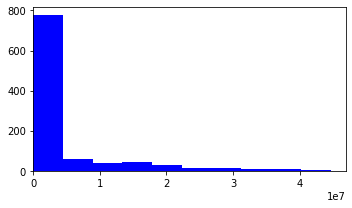

Timestep 1


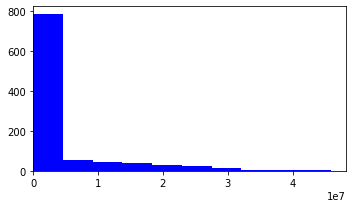

Timestep 2


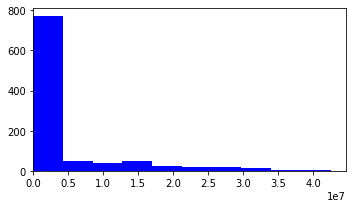

Timestep 3


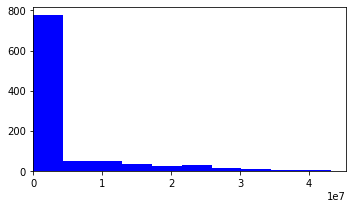

In [63]:
locations = ["A.4"]
step=[0,1,2]
outcome= "Expected Annual Damage"
print("Plot Expected Annual Damage for Dike Ring 4")
for step in range(0, 4):
    print("Timestep " + str(step))
    fig, ax = plt.subplots(1, 1, figsize=(5, 3))
    ax.hist(results["A.4_"+ str(outcome) + " " + str(step)], color="blue")
    ax.set_xlim(left=0)
    

    plt.tight_layout()
    plt.show()    

The histograms for all timesteps is right-skewed. This means that the probability of a maximum expected annual damage for all timesteps is very low. The higher the probability for an annual expected damage is, the lower is the expected value.

#### Plotting the number of expected deaths over all time steps at dike ring 4

Plot Expected Number of Deaths for Dike Ring 4
Timestep 0


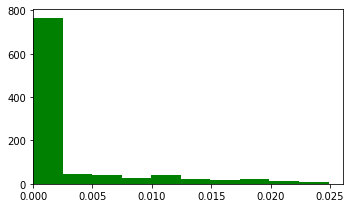

Timestep 1


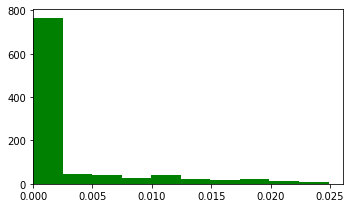

Timestep 2


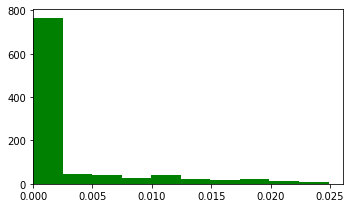

Timestep 3


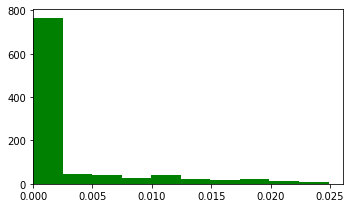

In [62]:
locations = ["A.4"]
step=[0,1,2]
outcome= "Expected Number of Deaths"
print("Plot Expected Number of Deaths for Dike Ring 4")
for step in range(0, 4):
    print("Timestep " + str(step))
    fig, ax = plt.subplots(1, 1, figsize=(5, 3))
    ax.hist(results["A.4_"+ str(outcome) + " " + str(step)], color="Green")
    ax.set_xlim(left=0)
    

    plt.tight_layout()
    plt.show()    

Similarly to the expected annual damage, the histogram for the expected number of deaths is right-skewed for all cases. Thus, a high number of the expected deaths is unlikely. But, it also shows that number of deaths can be expected with no policy in place. This indicates that levers are needed to decrease these values.

#### Pair plot between the outcomes of interest for all time steps

In [85]:
## pair plot between the two outcomes across timesteps to test the pairplot
pp_vars=[]
a4= "A.4"
for col in experiments.columns:
    if a4 in col:
        if(("pfail" in col) or ("Brate" in col) or ("Bmax" in col)):
            pp_vars.append(col)


#### Pairplot for Time step 0

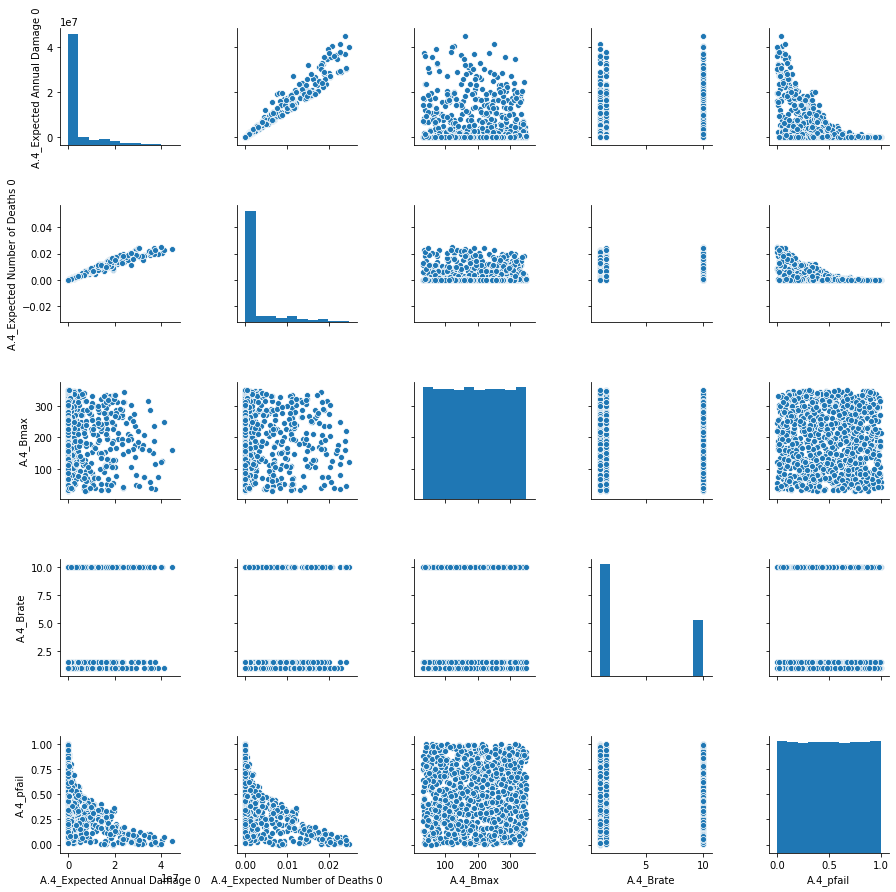

In [86]:
pp0= []
for c in req_vars:
    if str(0) in c:
        pp0.append(c)
pp0=pp0+ pp_vars

#timestep 0 
sns.pairplot(results1[pp0])
plt.tight_layout
plt.show()

#### Pairplot for Time step 1

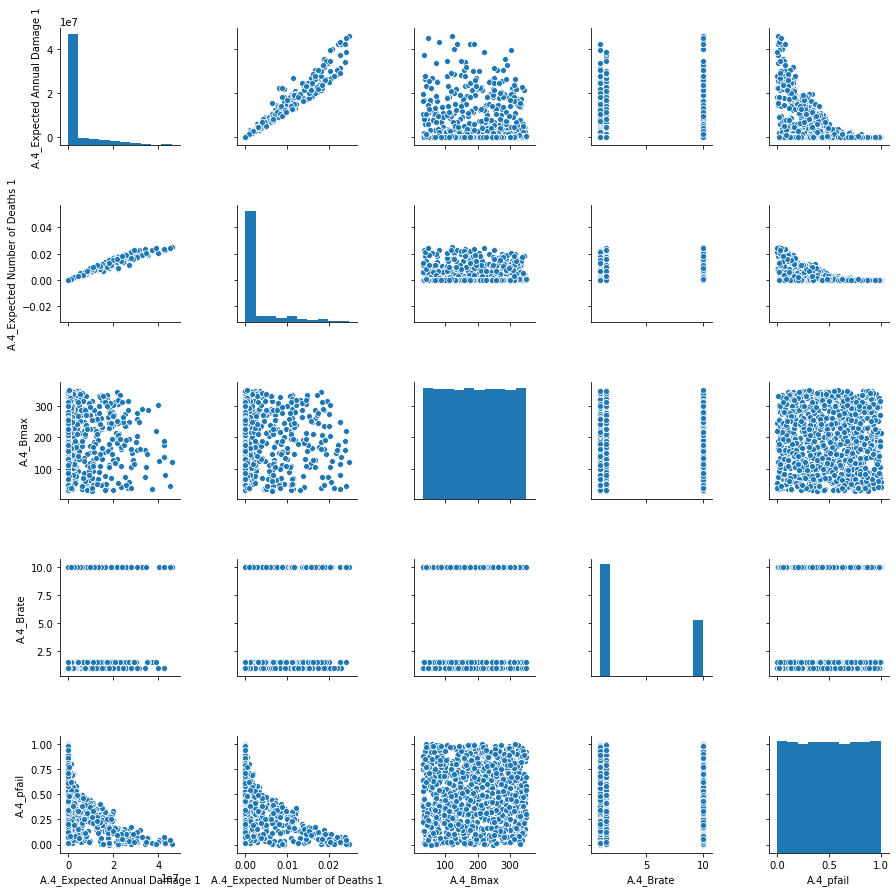

In [87]:
pp1= []
for c in req_vars:
    if str(1) in c:
        pp1.append(c)
pp1=pp1+ pp_vars

#timestep 1 
sns.pairplot(results1[pp1])
plt.tight_layout
plt.show()

#### Pairplot for Time step 2

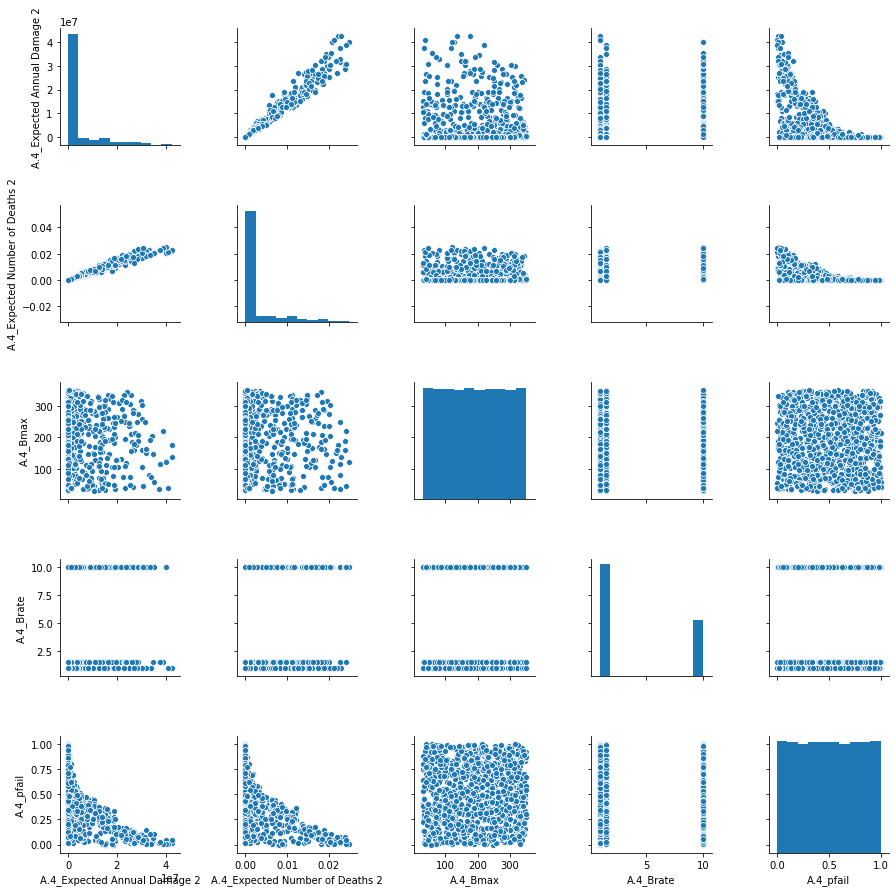

In [88]:
pp2= []
for c in req_vars:
    if str(2) in c:
        pp2.append(c)
pp2=pp2+ pp_vars

#timestep 2 
sns.pairplot(results1[pp2])
plt.tight_layout
plt.show()

#### Pairplot for Time step 3

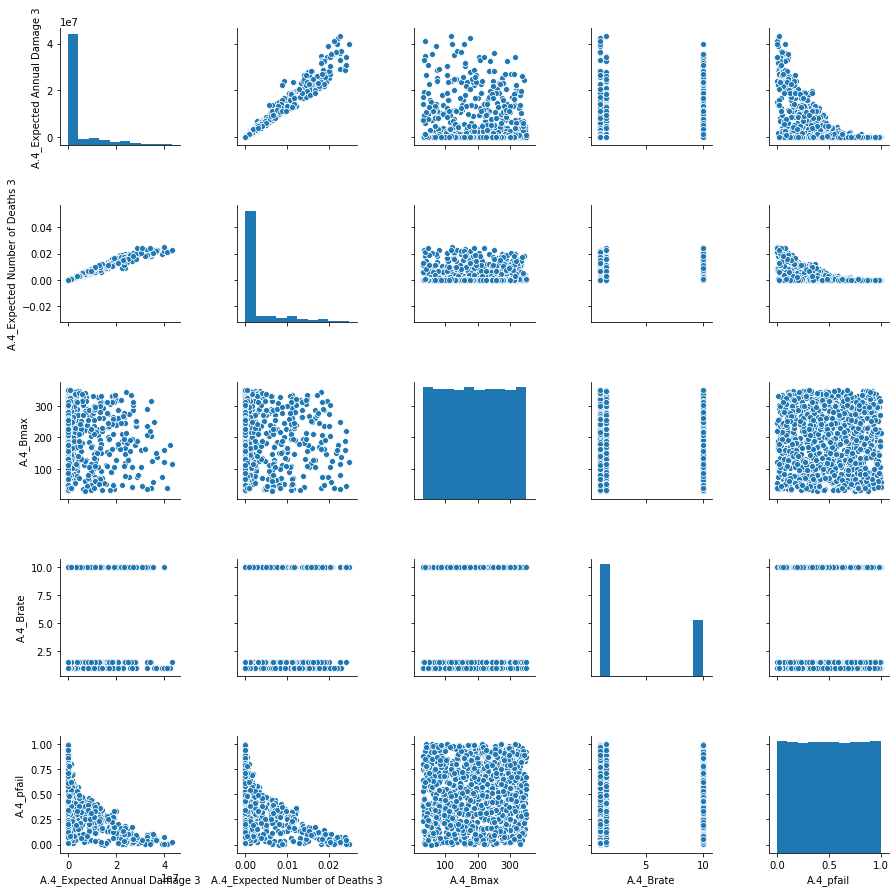

In [89]:
pp3= []
for c in req_vars:
    if str(3) in c:
        pp3.append(c)
pp3=pp3+ pp_vars

#timestep 0 
sns.pairplot(results1[pp3])
plt.tight_layout
plt.show()

The following points can be observed from the pairplots of the outcomes and uncertainties over all timesteps:
1. The pairplots are idential over all timesteps. This makes sense as the implemented policy, no policy, does not change over the time steps.
2. An almost linear relationship exists between the expected annual damage and the number of deaths. The higher the expected annual damage, the higher is the expected number of deaths.
3. The shape of the scatterplot between the dike failure probability and th eexpected annual damage and the expected number of deaths is very similar. A high dike failure probability creates a higher annual damage and number of deaths, and on the contrast,a low dike failure probability creates a lower annual damage and number of deaths . The outcomes of the scatterplots almost follow a negative exponential distribution. The outcomes are all mapped below the curve. 
4. No relationship can be discovered between the uncertainties dike failure probability and the final extent of the breach width.
5. Given the final extent of the breach width, the expected number of death and the expected annual damage are spread out equally. Thus, no direct pattern can be observed.
6. Furthermore, no direct relationship can be observed between growth rate of the breach width and the annual expected damage and the expected number of deaths.

## Running the model with 20 random policies for further exploration

In [8]:
start = time.time()
with MultiprocessingEvaluator(dike_model) as evaluator:
    experiments,outcomes = evaluator.perform_experiments(scenarios=1000, policies=20)

end = time.time()
print("time taken: {} seconds".format((end-start)))

[MainProcess/INFO] pool started
[MainProcess/INFO] performing 1000 scenarios * 20 policies * 1 model(s) = 20000 experiments
[MainProcess/INFO] 2000 cases completed
[MainProcess/INFO] 4000 cases completed
[MainProcess/INFO] 6000 cases completed
[MainProcess/INFO] 8000 cases completed
[MainProcess/INFO] 10000 cases completed
[MainProcess/INFO] 12000 cases completed
[MainProcess/INFO] 14000 cases completed
[MainProcess/INFO] 16000 cases completed
[MainProcess/INFO] 18000 cases completed
[MainProcess/INFO] 20000 cases completed
[MainProcess/INFO] experiments finished
[MainProcess/INFO] terminating pool


time taken: 15087.743062257767 seconds


To reproduce the results of this model run, the experiments and outcomes are saved.

In [10]:
from ema_workbench.util import utilities 

resultspol = experiments,outcomes
utilities.save_results(resultspol, '20Policies_1000_PF5')

[MainProcess/INFO] results saved successfully to C:\Users\VANNESYA\Documents\Study\Q4\EPA1361\common_MBDM\final assignment\20Policies_1000_PF5
